**Importing Required libraries**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls "/content/drive/My Drive"

 1653544495136.jpg				 Organization.drawio
 1684588940998.jpg				 password.txt
'31 copy.jpg'					'Photo from Fahad'
'AI PROJECTS DATASETS SECTION A.gsheet'		 Pix2Pix.drawio
'Analysis Level Use Case Diagram.drawio'	 quicksquarenew_202083182816599.jpg
'Bank Account '					 Resume-Muhammad-Fahad.pdf
 Chats						'Sequence Diagram.drawio'
'Class Diagram.drawio'				 site-map.drawio
 Classroom					'SSD Authentication.drawio'
'Colab Notebooks'				'SSD For Model.drawio'
'collaboration diagram.drawio'			'SSD For Sketching.drawio'
'CS102 PF-Midterm Paper Student Copy (2).gdoc'	'State Chart Diagram.drawio'
'Document from Fahad'				 stroyboards.drawio
 DomainModel.drawio				'Untitled Diagram (1).drawio'
 FinalProject					'Untitled Diagram (2).drawio'
'High Level Use Case Diagram.drawio'		'Untitled Diagram (3).drawio'
'id card.pdf'					'Untitled Diagram (4).drawio'
 IMG_20191129_180029_728.jpg			'Untitled Diagram (5).drawio'
 IMG-20200612-WA0001.jpg			'Untitled Diagram.drawio'
 myId.pdf					'Untitled

In [3]:
!unzip -q "/content/drive/My Drive/FinalProject/train.zip"

In [4]:
!unzip -q "/content/drive/My Drive/FinalProject/test.zip"

In [5]:
import tensorflow as tf

import os
import time

import matplotlib.pyplot as plt
# from IPython import display

**Unzip folders that we uploaded to Google Colab Server**

**Hyperparameters for our Model**

In [6]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

**Path of Data**

In [7]:
gluedPath = 'train/'

**Load Data by splitting pixels and seperating images**

In [8]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

**Preprocessing Data**

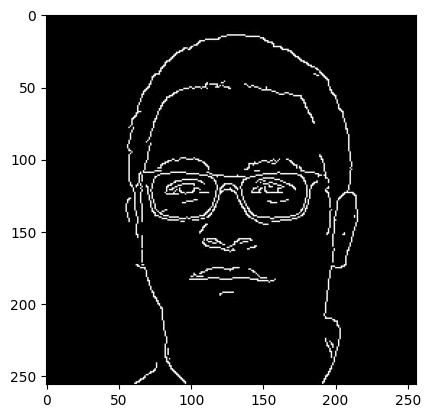

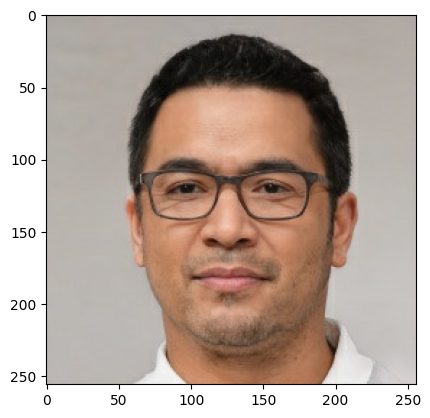

In [9]:
inp, re = load(gluedPath+'glued_human_face_61.jpg')
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [10]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [11]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [12]:
# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [13]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

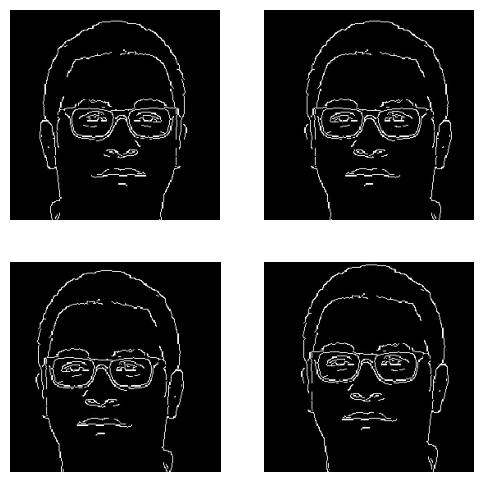

In [14]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1),
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [15]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [16]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [17]:
train_dataset = tf.data.Dataset.list_files(gluedPath+'*.jpg')
train_dataset = train_dataset.map(load_image_train)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [18]:
test_dataset = tf.data.Dataset.list_files('test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [19]:
OUTPUT_CHANNELS = 3

**Model Architecture**

In [20]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [21]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [22]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [23]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


**Generator**

In [24]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [25]:

#If you want to start a new Generator model use this code

generator = Generator()

#If you want to load your previous generator model you can with the following code.
#By loading it you will be able to continue training it!

# generator = tf.keras.models.load_model("trained_networkOVERNIGHT3.h5")


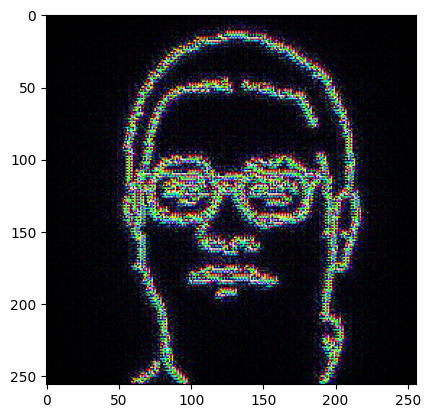

In [26]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

In [27]:
LAMBDA = 100

In [28]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

**Discriminator**

In [29]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [30]:
discriminator = Discriminator()
# tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

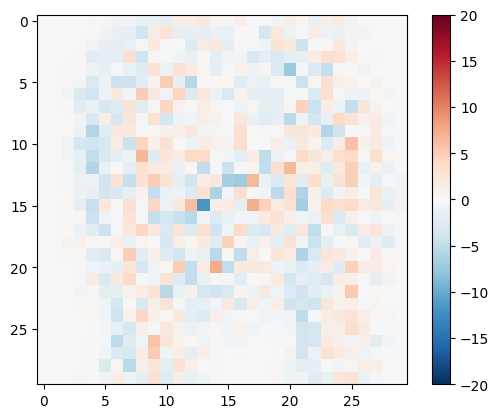

In [31]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [32]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [33]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

**Hyperparameters for our models, feel free to tweak these for varying results**

In [34]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [35]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

**Generate Images Function**

In [36]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

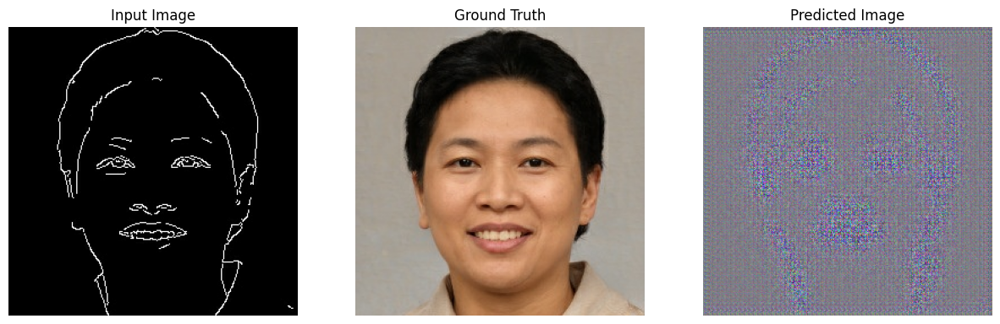

In [37]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

**Training Phase**

In [38]:
#Change this to whatever you want, normally more epochs = better model ( but be careful of overfitting *)
EPOCHS = 20

In [39]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [40]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        tf.print("Generator Total Loss:", gen_total_loss)
        tf.print("Generator GAN Loss:", gen_gan_loss)
        tf.print("Generator L1 Loss:", gen_l1_loss)
        tf.print("Discriminator Loss:", disc_loss)

    generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)


In [41]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()

        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch+1)

        # Train
        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 120 == 0:
                print()

        # Call train_step after processing the entire training dataset
        print()
        train_step(input_image, target, epoch)
        print()

        # Saving (checkpoint) the model every 10 epochs
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))
    checkpoint.save(file_prefix=checkpoint_prefix)

**Training the Model**

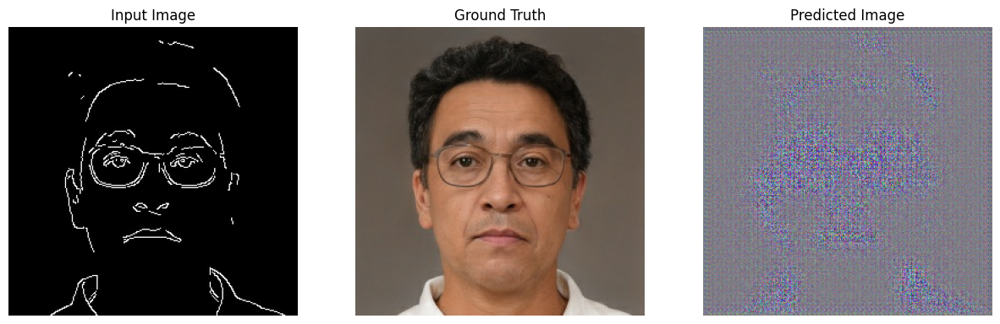

Epoch:  1
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

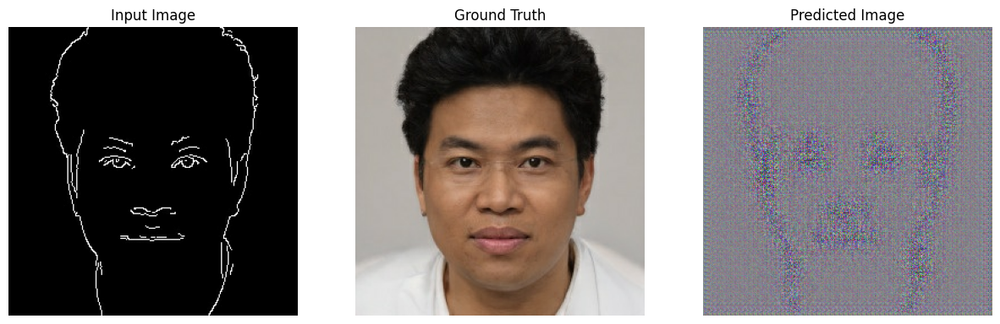

Epoch:  2
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

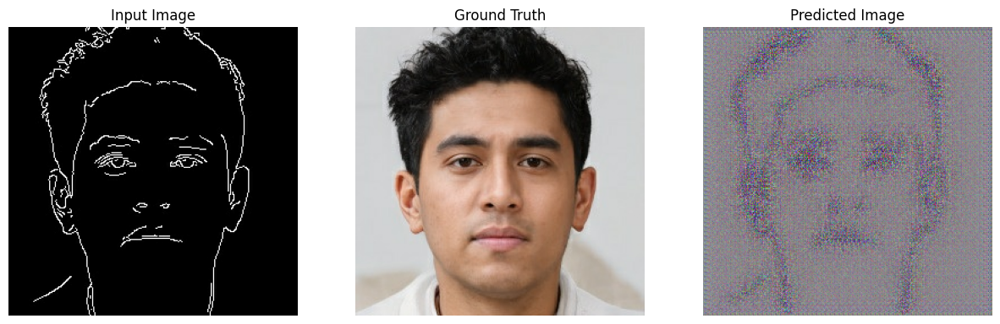

Epoch:  3
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

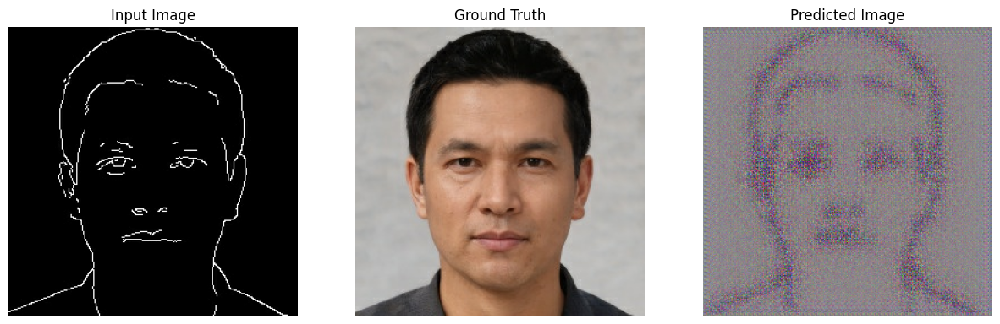

Epoch:  4
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

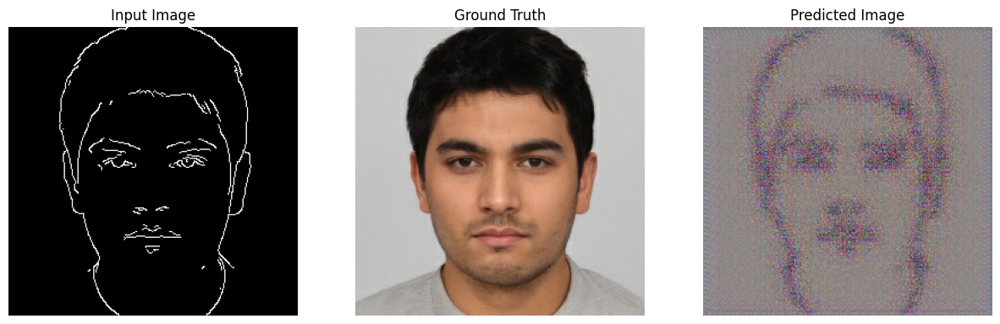

Epoch:  5
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................


Time taken for epoch 5 is 21.216553211212158 sec



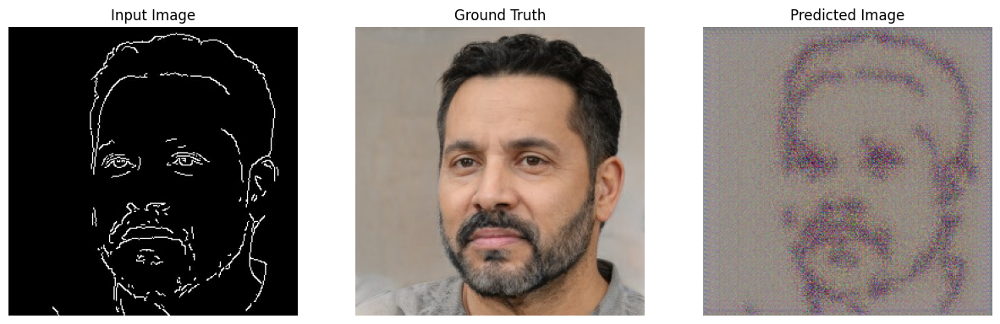

Epoch:  6
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................


Time taken for epoch 6 is 21.862805604934692 sec



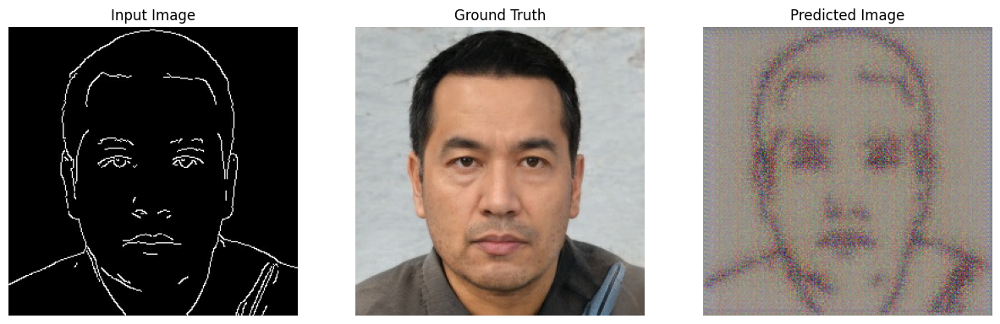

Epoch:  7
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

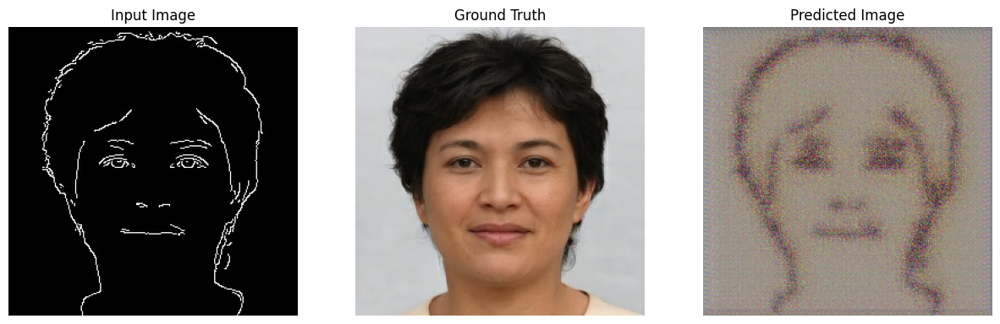

Epoch:  8
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

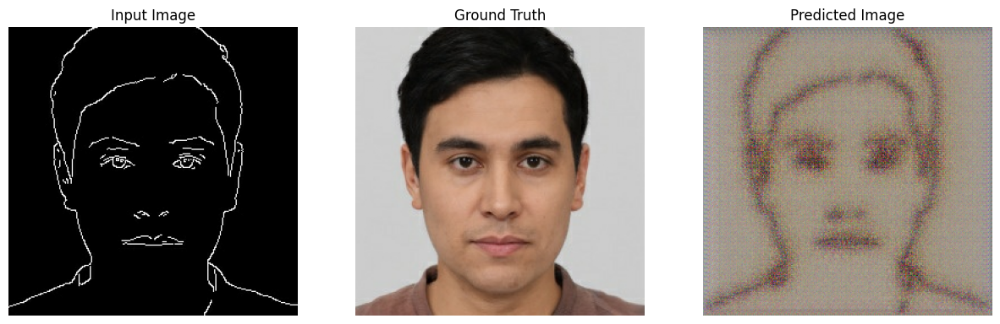

Epoch:  9
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
......................

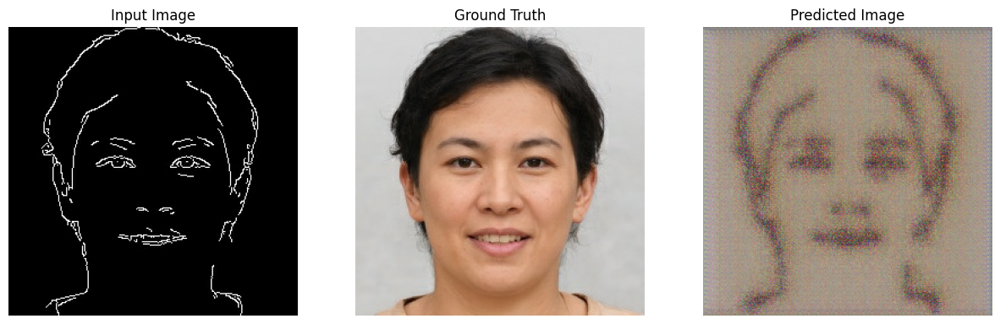

Epoch:  10
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

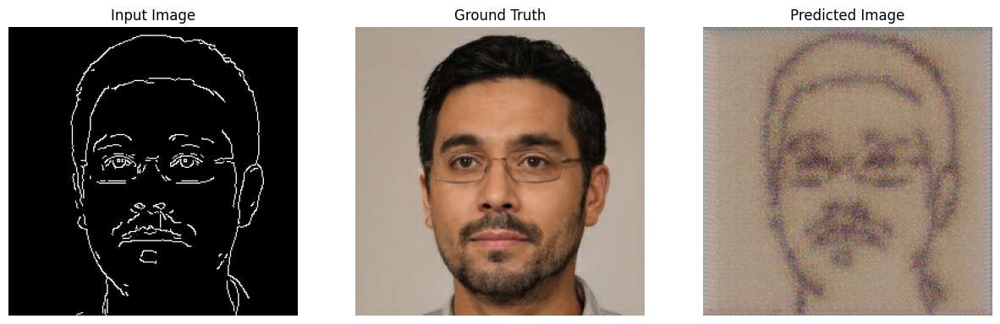

Epoch:  11
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

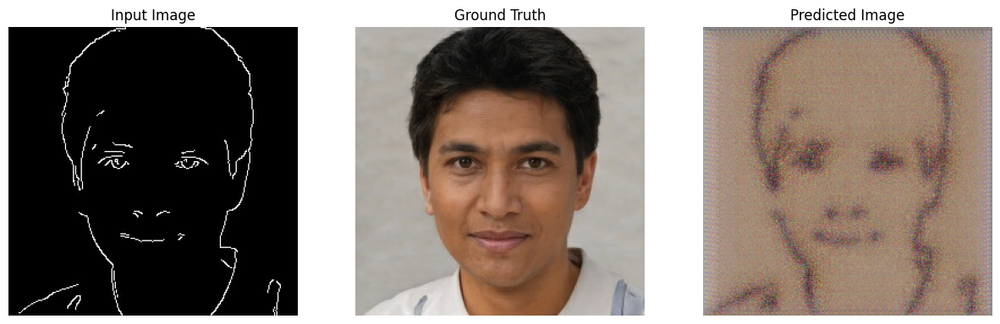

Epoch:  12
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

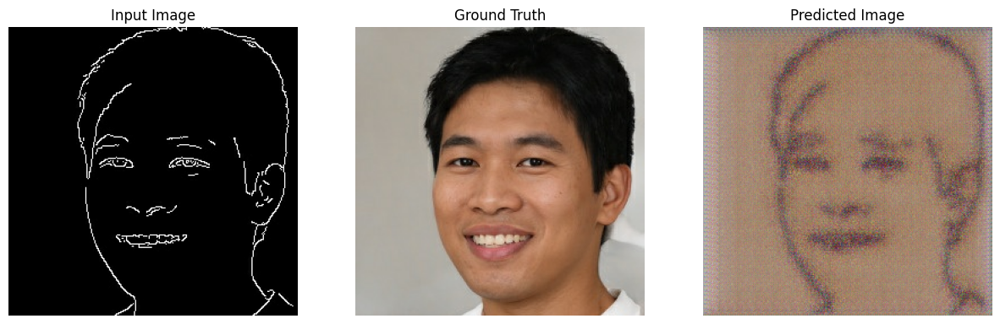

Epoch:  13
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

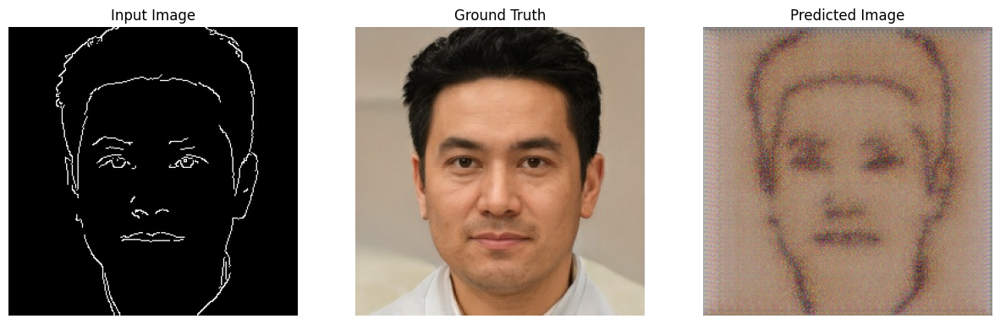

Epoch:  14
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

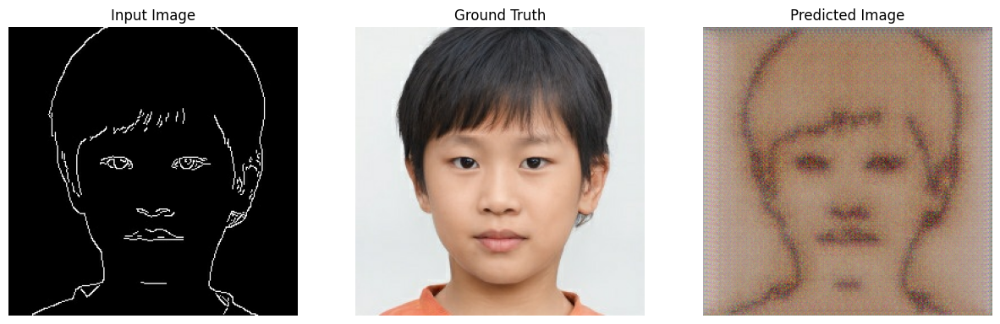

Epoch:  15
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

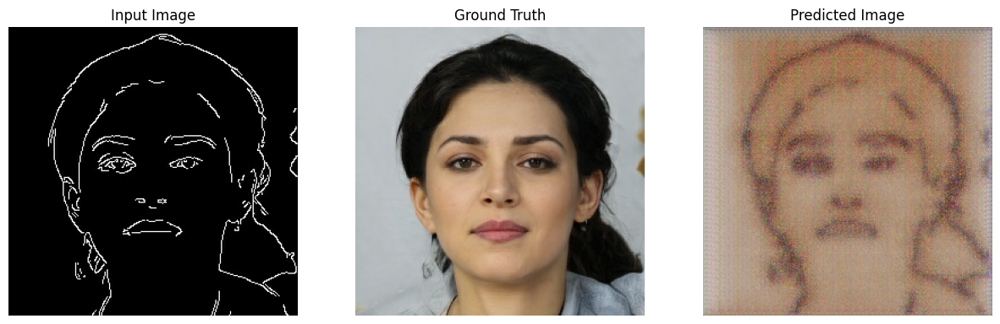

Epoch:  16
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

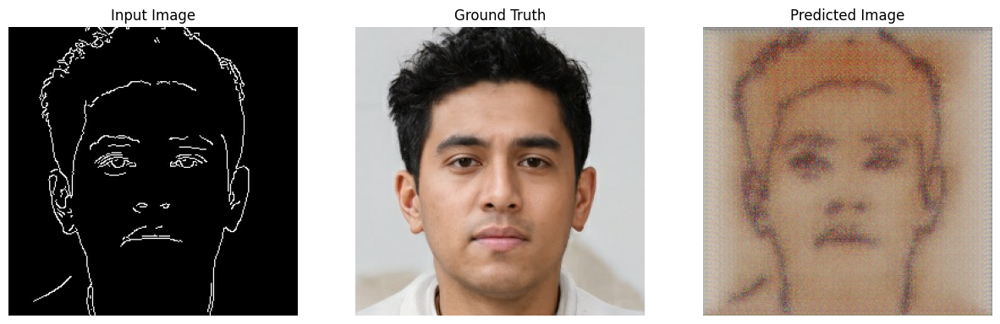

Epoch:  17
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

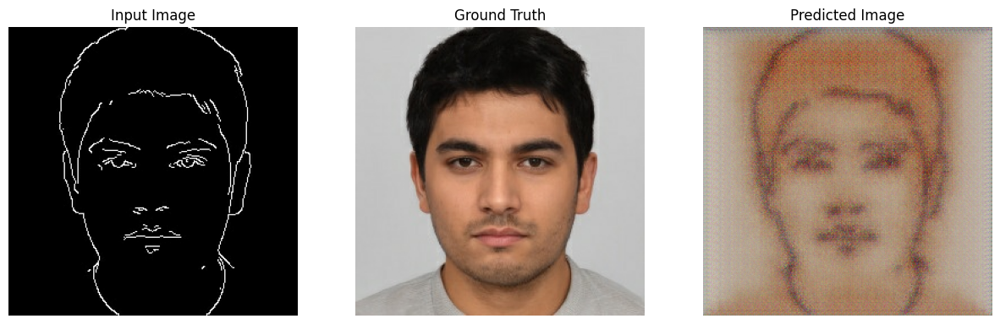

Epoch:  18
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

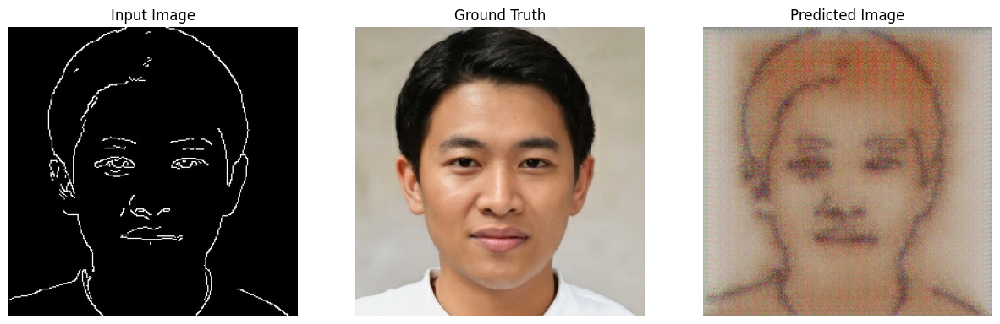

Epoch:  19
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

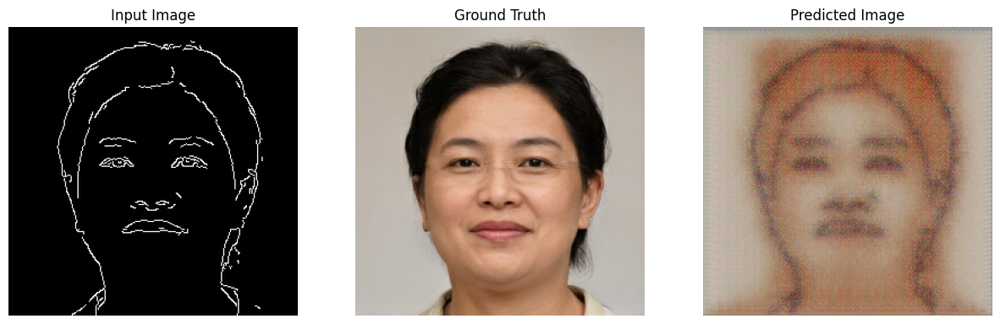

Epoch:  20
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
........................................................................................................................
.....................

In [42]:
fit(train_dataset, EPOCHS, test_dataset)

**Saving the Model**

In [43]:
# Specify the directory path where you want to save the model
save_path = '/content/drive/My Drive/FinalProject/20epochs.h5'

In [44]:
generator.save(save_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/usr/local/lib/python3.10/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


**Testing on your own images**

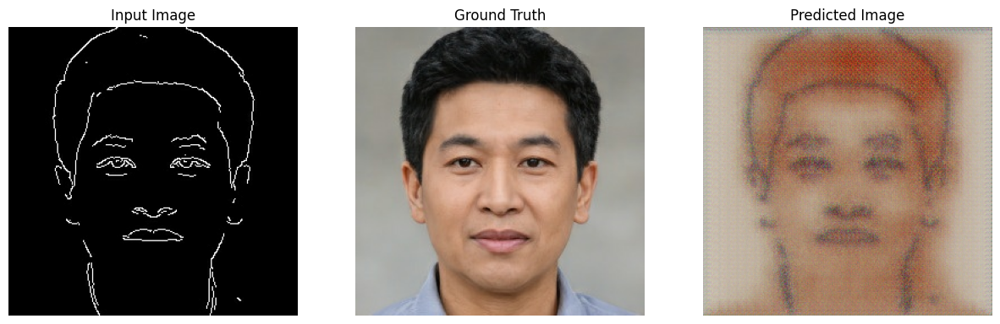

In [46]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)